# Pan-cancer (PC) plasma proteome Paper — Figure 3

This Jupyter Notebook (with Python 3 kernel) contained the code for the proteomic analysis of the characteristic of tumors of different physiological system groups

Input files:  
* The categorical clinical file: category.csv
* The continuous clinical fille: continuous.csv
* The PC proteome file: proteome.csv

Output figures:  
* Figure 3a, 3b, 3c, 3e, 3f, 3g, S6

In [2]:
from utils import *
paths = ['../figure/figure3', '../documents/figure3']
for path in paths:
    if not os.path.isdir(path):
        os.makedirs(path)

a = Analysis('../')

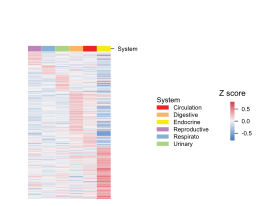

In [2]:
from utils.function import large_than_n_value
a.set_param('group', dataset_type='proteome', group_name='System')
df = a.table.query('alexandergovern_fdr<0.05').filter(like='mean')
large_than_ = large_than_n_value(df)
order_ = large_than_.sort_values(df.columns.tolist(), ascending=[False]*df.shape[1]).index
plotdata = a.merge_data_group(order_).apply(scipy.stats.zscore, nan_policy='omit').droplevel(0).groupby('System', sort=False).mean().T
plotdata.to_csv('../documents/figure3/Source_data_Fig3a.csv')

fig = heatmap(plotdata, yticklabels=False, vmax=.8, vmin=-.8, lut={'System': a._color_map['System']}, figsize=(2, 3))
fig.ax_cbar.set_title('Z score')
fig.savefig('../figure/figure3/Fig3a.pdf', bbox_inches='tight')

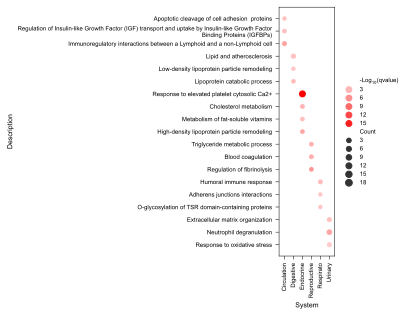

In [4]:
import matplotlib.colors as mcolors
cmap = mcolors.LinearSegmentedColormap.from_list(
    "red_blue_gradient", ['#FFCACA', '#fc0000'], N=256)

o = ora('clusterprofiler')
enrich_table = pd.DataFrame()
for system_ in large_than_.columns:
    query_condition_ = f"{system_}==True"
    gene = large_than_.query(query_condition_).index.tolist()
    enrich_table_tmp = o.run(gene, db=['hallmark', 'kegg', 'reac', 'go'])
    enrich_table_tmp.insert(0, 'System', system_.split('_')[0])
    enrich_table = pd.concat([enrich_table, enrich_table_tmp])
enrich_table.to_csv('../documents/figure3/Fig3b_enrichment_table.csv')

terms = {
    'Circulation': ['Regulation of Insulin-like Growth Factor (IGF) transport and uptake by Insulin-like Growth Factor Binding Proteins (IGFBPs)', 'Immunoregulatory interactions between a Lymphoid and a non-Lymphoid cell', 'Apoptotic cleavage of cell adhesion  proteins'],
    'Digestive': ['Lipid and atherosclerosis', 'lipoprotein catabolic process', 'low-density lipoprotein particle remodeling'],
    'Endocrine': ['Response to elevated platelet cytosolic Ca2+', 'high-density lipoprotein particle remodeling', 'Cholesterol metabolism', 'Metabolism of fat-soluble vitamins'],
    'Reproductive': ['regulation of fibrinolysis', 'blood coagulation', 'triglyceride metabolic process'],
    'Respirato': ['humoral immune response', 'Adherens junctions interactions', 'O-glycosylation of TSR domain-containing proteins'],
    'Urinary': ['response to oxidative stress', 'Neutrophil degranulation', 'Extracellular matrix organization']
}
query_condition_ = ""
for k, v in terms.items():
    query_condition_ += f"System=='{k}'&Description in {v}|"
query_condition_ = query_condition_[:-1]
plotdata = enrich_table.query(query_condition_).sort_values('System')[['System', 'Description', 'qvalue', 'Count']]
plotdata = plotdata.assign(qvalue=-np.log10(plotdata['qvalue'])).rename(columns={'qvalue': '-$\mathregular{Log_{10}}$(qvalue)'})
plotdata['Description'] = plotdata['Description'].str[0].str.upper() + plotdata['Description'].str[1:]
plotdata.to_csv('../documents/figure3/Source_data_Fig3b.csv')

ax = scatterplot(plotdata, figsize=(1, 4.5), palette=cmap, sizes=(20, 50), spines_hide=[], wrap_length=100, ticklabels_hide=[], ticklabels_format=[])
ax.set_xlim([-.6, 5.6])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.get_figure().savefig('../figure/figure3/Fig3b.pdf', bbox_inches='tight')

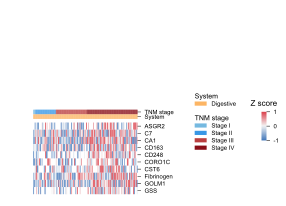

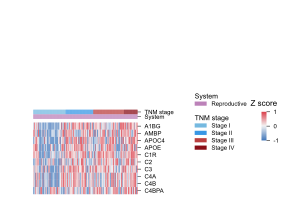

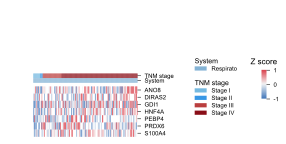

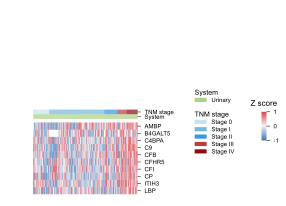

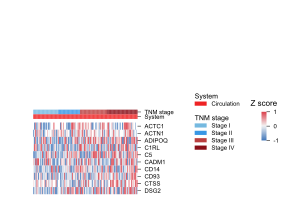

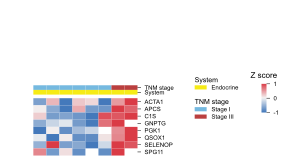

In [59]:
from utils.eplot.base import _heatmap_legend_handle

tnm_markers = {}
mapping_ = dict(zip(np.unique(a.category['TNM stage'].dropna()), range(5)))
a._data['tnm_tmp'] = a.category['TNM stage'].dropna().apply(lambda x: mapping_.get(x)).to_frame().T.sort_values('TNM stage', axis=1)
for system_ in a.category.System.dropna().unique():
    a.set_param('corr', name1='tnm_tmp', name2='proteome', element1='TNM stage', element2='all', group_name=['TNM stage', 'System'], part_element=[a.category['TNM stage'].dropna().unique().tolist(), [system_]], thresh=.5)
    plot_gene = a.corr_table.query("pearson_corr>0.2&pearson_pvalues<0.05").index
    tnm_markers[system_] = plot_gene
    plot_gene = np.setdiff1d(plot_gene, ['Serine/threonine-protein'])[:10]
    a.set_param('group', dataset_type='proteome', group_name=['TNM stage', 'System'], part_element=[a.category['TNM stage'].dropna().sort_values().unique().tolist(), [system_]], thresh=.5)

    height = 0.3*len(plot_gene)
    plotdata, fig = a.heat(plot_gene, figsize=(2.5, height), colors_ratio=0.08/height, yticklabels=False, cbar_pos=(1.45, .35, .03, 0.4/height), return_data=True)
    fig.ax_cbar.set_title('Z score')
    fig.ax_heatmap.set_yticks([i+0.5 for i in range(len(plot_gene))])
    fig.ax_heatmap.set_yticklabels(plot_gene)
    hp = fig.ax_heatmap.get_position()
    hp_height = 0.1*len(plot_gene) / height
    fig.ax_heatmap.set_position([hp.x0, 0.1, hp.width, hp_height])
    cp = fig.ax_col_colors.get_position()
    fig.ax_col_colors.set_position([cp.x0, 0.1+hp_height+0.05/height, cp.width, 0.13/height])
    fig.savefig(f'../figure/figure3/Fig3c_{system_}.pdf', bbox_inches='tight')
    
    plotdata.pipe(scipy.stats.zscore, nan_policy='omit').T.to_csv(f'../documents/figure3/Source_data_Fig3c_{system_}.csv')
pd.DataFrame().from_dict(tnm_markers, orient='index').to_csv('../documents/figure3/Fig3c_system_TNM_marker.csv', header=None)

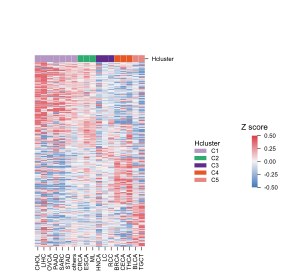

In [63]:
from utils.function import large_than_n_value
a.set_param('group', dataset_type='proteome', group_name='Hcluster', thresh=.8)
df = a.table.query('kruskal_pvalues<0.05').filter(like='mean')
df.to_csv('../documents/figure3/Fig3e_comparison_table.csv')

large_than_ = large_than_n_value(df).sort_index(axis=1)
order_ = large_than_.sort_values(large_than_.columns.tolist(), ascending=[False]*large_than_.shape[1]).index
plotdata = a.merge_data_group(order_, group_name=['Sample type', 'Hcluster']).apply(scipy.stats.zscore, nan_policy='omit').groupby(['Hcluster', 'Sample type']).mean().T
plotdata.to_csv('../documents/figure3/Source_data_Fig3e_right-panel.csv')

palette = {k: v for k, v in a._color_map['Hcluster'].items() if 'benign' not in k if k != 'normal'}
fig = heatmap(plotdata, yticklabels=False, xticklabels=plotdata.columns.get_level_values(1), lut={'Hcluster': palette}, figsize=(2.5, 4), cbar_pos=(1.4, .35, .03, .18), vmax=.5, vmin=-.5)
fig.ax_cbar.set_title('Z score')
fig.savefig('../figure/figure3/Fig3e_right-panel.pdf', bbox_inches='tight')

In [64]:
o = ora('clusterprofiler')
enrich_table = pd.DataFrame()
for cluster in large_than_.columns:
    query_condition_ = f"{cluster}==True"
    gene = large_than_.query(query_condition_).index.tolist()
    enrich_table_tmp = o.run(gene, db=['hallmark', 'kegg', 'reac', 'go'])
    enrich_table_tmp.insert(0, 'Hcluster', cluster.rsplit('_', maxsplit=1)[0])
    enrich_table = pd.concat([enrich_table, enrich_table_tmp])
enrich_table.to_csv('../documents/figure3/Fig3e_enrichment_table.csv')

R[write to console]: 'select()' returned 1:1 mapping between keys and columns

R[write to console]: `universe` is not in character and will be ignored...

R[write to console]: 'select()' returned 1:1 mapping between keys and columns

R[write to console]: `universe` is not in character and will be ignored...

R[write to console]: 'select()' returned 1:1 mapping between keys and columns

R[write to console]: `universe` is not in character and will be ignored...

R[write to console]: 'select()' returned 1:1 mapping between keys and columns

R[write to console]: `universe` is not in character and will be ignored...

R[write to console]: 'select()' returned 1:1 mapping between keys and columns

R[write to console]: `universe` is not in character and will be ignored...

R[write to console]: 'select()' returned 1:1 mapping between keys and columns

R[write to console]: `universe` is not in character and will be ignored...

R[write to console]: 'select()' returned 1:1 mapping between keys and 

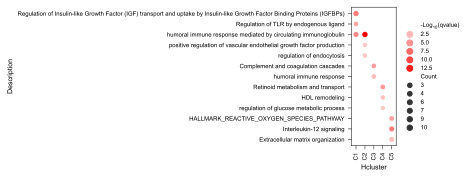

In [66]:
import matplotlib.colors as mcolors
cmap = mcolors.LinearSegmentedColormap.from_list("red_blue_gradient", ['#FFCACA', '#fc0000'], N=256)

terms = {
    'C1': ['Regulation of Insulin-like Growth Factor (IGF) transport and uptake by Insulin-like Growth Factor Binding Proteins (IGFBPs)', 'humoral immune response mediated by circulating immunoglobulin', 'Regulation of TLR by endogenous ligand'],
    'C2': ['humoral immune response mediated by circulating immunoglobulin', 'positive regulation of vascular endothelial growth factor production', 'positive regulation of endocytosis', 'regulation of endocytosis'],
    'C3': ['humoral immune response', 'triglyceride-rich lipoprotein particle remodeling', 'Complement and coagulation cascades'],
    'C4': ['regulation of glucose metabolic process', 'HDL remodeling', 'Retinoid metabolism and transport'],
    'C5': ['Interleukin-12 signaling', 'HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY', 'Extracellular matrix organization']
}

plotdata = pd.DataFrame()
for k, v in terms.items():
    tmp_plotdata = enrich_table.query("Hcluster==@k&Description in @v")[['Hcluster', 'Description', 'qvalue', 'Count']]
    plotdata = pd.concat([plotdata, tmp_plotdata])
plotdata = plotdata.assign(qvalue=-np.log10(plotdata['qvalue'])).rename(columns={'qvalue': '-$\mathregular{Log_{10}}$(qvalue)'})
plotdata.to_csv('../documents/figure3/Source_data_Fig3e_left-panel.csv')

ax = scatterplot(plotdata, figsize=(.8, 2.5), spines_hide=[], palette=cmap, sizes=(20, 30), ticklabels_wrap=[], ticklabels_hide=[], ticklabels_format=[])
ax.set_xticklabels([f'C{i}' for i in range(1, 6)], rotation=90)
ax.set_xlim([-.5, 4.5])
ax.get_figure().savefig('../figure/figure3/Fig3e_left-panel.pdf', bbox_inches='tight')

In [15]:
import joblib

mapping_ = joblib.load('../document/unit.joblib')
part_element = [f'C{i}' for i in range(1, 6)]
a.set_param('group', dataset_type='continuous', group_name='Hcluster', thresh=0.5, part_element=part_element)
df = a.table.query("anova_pvalues<0.01").iloc[:, :5]
df = np.argsort(df).applymap(lambda x: 1 if x != 4 else 0)
indicators = df.sort_values(df.columns.tolist()).index[:-1]
fig, axs = plt.subplots(7, 4, figsize=(9, 8))
plt.subplots_adjust(wspace=.5, hspace=.5)

for i, (indicator, ax) in enumerate(zip(indicators, axs.ravel())):
    if i > 24:
        ticklabels_hide=[]
        labels_hide=[]
    else:
        ticklabels_hide=['x']
        labels_hide=['x']
    a.cate(indicator, box_pairs=None, quantile=True, stripsize=1, category_type=['box', 'strip'], spines_hide=['top', 'right'], ticklabels_hide=ticklabels_hide, labels_hide=labels_hide, ax=ax)[0]
    ylabel = mapping_.get(indicator, ' ')
    ax.set_ylabel(ylabel)
    if i > 24:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
fig.savefig('../figure/figure3/FigS6.pdf', bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


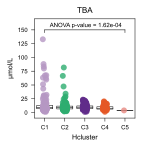

In [67]:
part_element = [f'C{i}' for i in range(1, 6)]
a.set_param('group', dataset_type='continuous', group_name='Hcluster', thresh=0, part_element=part_element)
plotdata, axs = a.cate('TBA', category_type=['box', 'strip'], box_pairs=None, spines_hide=[], return_data=True)
plotdata.to_csv('../documents/figure3/Source_data_Fig3f.csv')

ax = axs[0]
ax.set_ylim([-10, 170])
ax.plot((0, 4), (150, 150), c='black')
ax.plot((0, 0), (145, 150), c='black')
ax.plot((4, 4), (145, 150), c='black')
ax.text(0.25, 155, s="ANOVA p-value = {:.2e}".format(a.table.loc['TBA', 'anova_pvalues']))
ax.set_ylabel('µmol/L')
ax.get_figure().savefig('../figure/figure3/Fig3f.pdf', bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


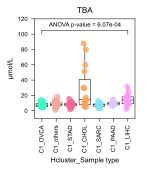

In [68]:
a.set_param('group', dataset_type='continuous', group_name=['Hcluster', 'Sample type'], thresh=0, part_element=[['C1'], a.category.query("Hcluster=='C1'")['Sample type'].unique()])
plotdata, axs = a.cate('TBA', category_type=['box', 'strip'], quantile=True, box_pairs=None, spines_hide=[], return_data=True)
plotdata.to_csv('../documents/figure3/Source_data_Fig3g.csv')

ax = axs[0]
ax.set_ylim([-10, 120])
ax.plot((0, 6), (105, 105), c='black')
ax.plot((0, 0), (100, 105), c='black')
ax.plot((6, 6), (100, 105), c='black')
ax.text(0.5, 110, s="ANOVA p-value = {:.2e}".format(a.table.loc['TBA', 'anova_pvalues']))
ax.set_ylabel('µmol/L')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.get_figure().savefig('../figure/figure3/Fig3g.pdf', bbox_inches='tight')